## CycleGAN

In this project we will explore the potential of Generative Adversarial Networks (GANs), with a specific focus on CycleGAN, to achieve unpaired image-to-image translation. By using advanced machine learning techniques, the CycleGAN model enables the transformation of images between two distinct domains without requiring paired examples. The study centers on a practical application: converting real-world photographs into Monet-style paintings.

Through this project, the key objectives are to demonstrate the capability of CycleGAN in artistic style transfer, analyze the performance of the model on a dataset of Monet paintings and photographs, and assess its potential for creative and industrial use cases. With an emphasis on unpaired data, the project highlights the flexibility and robustness of CycleGAN for tasks involving domain adaptation and visual transformations.

In [1]:
import os
import random
import warnings
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras import Model
import tensorflow.keras.layers as L
from PIL import Image
from tqdm import tqdm
import shutil

## Setup Environment 

The below code sets up the env for training the GAN model. This includes setting up the environment, checking for GPU availability, and loading the dataset. The dataset is loaded using the `tf.data.TFRecordDataset` function, which reads TFRecord files containing image data. The dataset is then preprocessed by converting the images to the desired size and normalizing the pixel values. The dataset is then shuffled and batched for training.

In [2]:
import os
import warnings
import random
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Suppress warnings and configure TensorFlow settings
def configure_environment():
    """
    Configures the environment to suppress warnings, set GPU visibility,
    and manage TensorFlow logging and memory growth.
    """
    warnings.filterwarnings("ignore")  # Suppress Python warnings
    os.environ['CUDA_DEVICE_ORDER'] = 'PCI_BUS_ID'  # Maintain consistent GPU order
    os.environ['CUDA_VISIBLE_DEVICES'] = '0'  # Use only the first GPU (ID: 0)
    os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true'  # Enable dynamic GPU memory allocation
    os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Suppress TensorFlow informational and warning logs

# Set random seeds for reproducibility
def set_seeds(seed=42):
    """
    Sets random seeds for Python, NumPy, and TensorFlow to ensure reproducible results.
    
    Args:
        seed (int): Seed value for reproducibility. Default is 42.
    """
    np.random.seed(seed)
    random.seed(seed)
    tf.random.set_seed(seed)

# Check TensorFlow version and GPU availability
def check_tensorflow_setup():
    """
    Prints the TensorFlow version and lists the available GPUs for computation.
    """
    print(f"TensorFlow Version: {tf.__version__}")
    gpus = tf.config.list_physical_devices('GPU')
    if gpus:
        print(f"GPUs available: {[gpu.name for gpu in gpus]}")
    else:
        print("No GPUs available. Running on CPU.")

# Define constants for image processing and training
IMG_HT, IMG_WD = 256, 256  # Image height and width
IMG_SIZE = (IMG_HT, IMG_WD)  # Image size tuple
BATCH_SIZE = 1  # Batch size for training
EPOCHS = 10  # Number of epochs for training
CHECKPOINT_DIR = 'checkpoints'  # Directory to save model checkpoints
AUTOTUNE = tf.data.AUTOTUNE  # Automatic data pipeline optimization

# Set Matplotlib style for consistent visualization
plt.style.use('default')

# Define dataset paths
def get_dataset_paths():
    """
    Retrieves file paths for the datasets.
    
    Returns:
        tuple: File paths for Monet and photo datasets.
    """
    monet_img_path = tf.io.gfile.glob('images/monet_tfrec/*')
    photo_img_path = tf.io.gfile.glob('images/photo_tfrec/*')
    if not monet_img_path or not photo_img_path:
        raise FileNotFoundError("Dataset paths are empty. Please check the paths.")
    return monet_img_path, photo_img_path

# Execute configuration and initialization
configure_environment()
set_seeds()
check_tensorflow_setup()
monet_img_path, photo_img_path = get_dataset_paths()


TensorFlow Version: 2.18.0
No GPUs available. Running on CPU.


## TFRecord File Preprocessing and Dataset Preparation

We will parse, preprocess, and prepare datasets from TFRecord files. We will decode, resize, normalize images, and apply batching, shuffling, and optional augmentation for efficient training.

In [3]:
# Read and preprocess TFRecord files
def read_tfrecord(example):
    """Parse and preprocess each TFRecord example."""
    tfrecord_format = {
        'image': tf.io.FixedLenFeature([], tf.string),
        'image_name': tf.io.FixedLenFeature([], tf.string),
        'target': tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = tf.image.decode_jpeg(example['image'])
    image = tf.image.resize(image, IMG_SIZE)
    image = image / 127.5 - 1  # Normalize to [-1, 1]
    return image

# Load dataset
def load_dataset(filenames, augment=False):
    """Load dataset from TFRecord files and apply optional augmentation."""
    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.map(read_tfrecord, num_parallel_calls=AUTOTUNE)
    if augment:
        dataset = dataset.map(image_augment, num_parallel_calls=AUTOTUNE)
    return dataset

# Prepare the dataset
def get_dataset(filenames, augment=True):
    """Prepare and batch the dataset."""
    dataset = load_dataset(filenames, augment)
    dataset = dataset.shuffle(2048).batch(BATCH_SIZE).prefetch(AUTOTUNE)
    return dataset

# Initialize datasets
monet_ds = get_dataset(monet_img_path, augment=False)
photo_ds = get_dataset(photo_img_path, augment=False)

## Dataset Loading and Preprocessing Pipeline



In [4]:
# Function to read and preprocess TFRecord files
def read_tfrecord(example):
    """
    Parse and preprocess each TFRecord example.
    
    Args:
        example (tf.Tensor): Serialized TFRecord example.
    
    Returns:
        tf.Tensor: Preprocessed image tensor.
    """
    # Define the format of the TFRecord data
    tfrecord_format = {
        'image': tf.io.FixedLenFeature([], tf.string),  # Encoded image data
        'image_name': tf.io.FixedLenFeature([], tf.string),  # Image name (optional)
        'target': tf.io.FixedLenFeature([], tf.string)  # Target label or category (optional)
    }
    
    # Parse the serialized TFRecord data
    example = tf.io.parse_single_example(example, tfrecord_format)
    
    # Decode the image from JPEG format and resize it
    image = tf.image.decode_jpeg(example['image'])
    image = tf.image.resize(image, IMG_SIZE)
    
    # Normalize the image pixel values to the range [-1, 1]
    image = image / 127.5 - 1
    return image

# Function to load the dataset
def load_dataset(filenames, augment=False):
    """
    Load dataset from TFRecord files and apply optional data augmentation.
    
    Args:
        filenames (list of str): List of TFRecord file paths.
        augment (bool): Whether to apply data augmentation.
    
    Returns:
        tf.data.Dataset: Preprocessed dataset.
    """
    # Create a dataset from the list of TFRecord files
    dataset = tf.data.TFRecordDataset(filenames)
    
    # Map the read_tfrecord function to parse and preprocess the data
    dataset = dataset.map(read_tfrecord, num_parallel_calls=AUTOTUNE)
    
    # Apply data augmentation if specified
    if augment:
        dataset = dataset.map(image_augment, num_parallel_calls=AUTOTUNE)
    
    return dataset

# Function to prepare the dataset
def get_dataset(filenames, augment=True):
    """
    Prepare and batch the dataset for training or evaluation.
    
    Args:
        filenames (list of str): List of TFRecord file paths.
        augment (bool): Whether to apply data augmentation.
    
    Returns:
        tf.data.Dataset: Batched and prefetched dataset.
    """
    # Load the dataset and optionally augment the data
    dataset = load_dataset(filenames, augment)
    
    # Shuffle the dataset, batch it, and prefetch for better performance
    dataset = dataset.shuffle(2048).batch(BATCH_SIZE).prefetch(AUTOTUNE)
    return dataset

# Initialize datasets
# Monet dataset (no augmentation applied)
monet_ds = get_dataset(monet_img_path, augment=False)

# Photo dataset (no augmentation applied)
photo_ds = get_dataset(photo_img_path, augment=False)


## Exploratory Data Analysis

Lets visualize and understand the dataset distribution of Monet and Photo datasets. We will plot the dataset sizes in a bar chart for comparison. We will also display sample images from each dataset in a 2x4 grid to provide an intuitive understanding of the data used for training the CycleGAN model.



Number of Monet images: 300
Number of Photo images: 7038


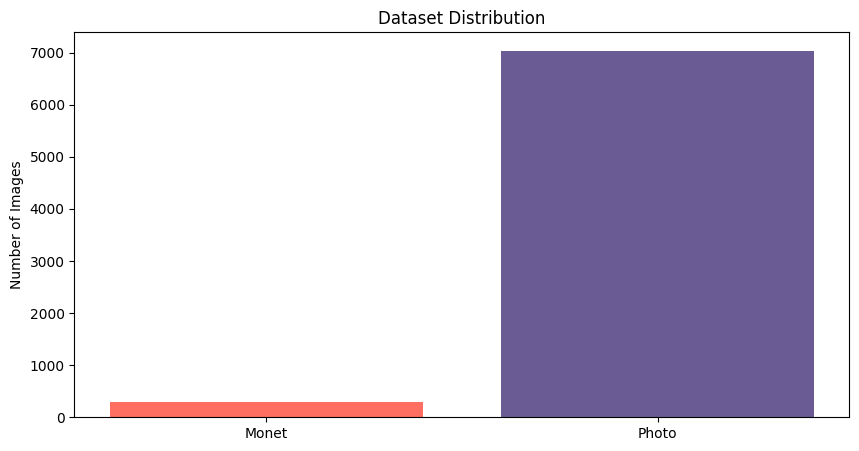

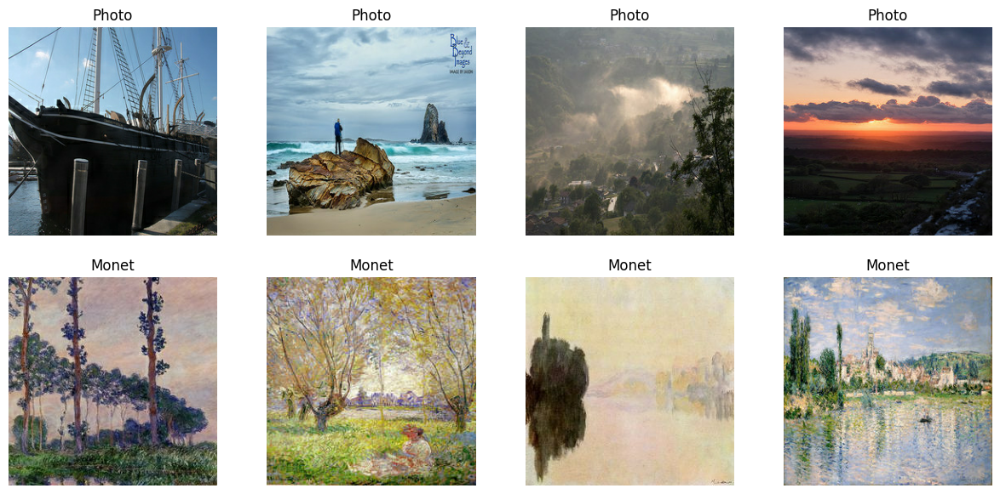

In [5]:
# Count the number of images in each dataset
monet_count = sum(1 for _ in tf.data.TFRecordDataset(monet_img_path))
photo_count = sum(1 for _ in tf.data.TFRecordDataset(photo_img_path))

# Display the counts for both datasets
print(f"Number of Monet images: {monet_count}")
print(f"Number of Photo images: {photo_count}")

# Plot the class distribution
plt.figure(figsize=(10, 5))
plt.bar(['Monet', 'Photo'], [monet_count, photo_count], color=['#FF6F61', '#6B5B95'])
plt.title("Dataset Distribution")  # Add title for clarity
plt.ylabel("Number of Images")  # Label the y-axis
plt.show()

# Display sample images from the Photo and Monet datasets for visualization
plt.figure(figsize=(15, 7))

# Display four sample images from the Photo dataset
for i, img in enumerate(photo_ds.take(4)):
    plt.subplot(2, 4, i + 1)  # Plot in the first row (2x4 grid)
    # Rescale pixel values back to [0, 255] and cast to uint8 for display
    plt.imshow(tf.cast((img[0] + 1) * 127.5, tf.uint8))
    plt.title("Photo")  # Set the title for Photo images
    plt.axis('off')  # Hide axes for better visualization

# Display four sample images from the Monet dataset
for i, img in enumerate(monet_ds.take(4)):
    plt.subplot(2, 4, i + 5)  # Plot in the second row (2x4 grid)
    # Rescale pixel values back to [0, 255] and cast to uint8 for display
    plt.imshow(tf.cast((img[0] + 1) * 127.5, tf.uint8))
    plt.title("Monet")  # Set the title for Monet images
    plt.axis('off')  # Hide axes for better visualization

# Show the complete visualization grid
plt.show()


## CycleGAN Generator and Discriminator Model Architectures

We will define the core architecture for the CycleGAN model, including the generator and discriminator. The generator uses a U-Net structure with downsampling and unsampling blocks. 

In [6]:
# Define downsample block
def downsample(filters, size, apply_batchnorm=True):
    """Create a downsampling block for the generator/discriminator."""
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = tf.random_normal_initializer(1., 0.02)
    block = tf.keras.Sequential()
    block.add(L.Conv2D(filters, size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False))
    if apply_batchnorm:
        block.add(L.BatchNormalization(gamma_initializer=gamma_init))
    block.add(L.LeakyReLU())
    return block

# Define upsample block
def upsample(filters, size, apply_dropout=False):
    """Create an upsampling block for the generator."""
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = tf.random_normal_initializer(1., 0.02)
    block = tf.keras.Sequential()
    block.add(L.Conv2DTranspose(filters, size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False))
    block.add(L.BatchNormalization(gamma_initializer=gamma_init))
    if apply_dropout:
        block.add(L.Dropout(0.5))
    block.add(L.ReLU())
    return block

# Build the generator model
def build_generator():
    """Create a CycleGAN generator model."""
    inputs = L.Input(shape=[256, 256, 3])
    
    down_stack = [
        downsample(64, 4, apply_batchnorm=False),  # (bs, 128, 128, 64)
        downsample(128, 4),  # (bs, 64, 64, 128)
        downsample(256, 4),  # (bs, 32, 32, 256)
        downsample(512, 4),  # (bs, 16, 16, 512)
        downsample(512, 4),  # (bs, 8, 8, 512)
        downsample(512, 4),  # (bs, 4, 4, 512)
        downsample(512, 4),  # (bs, 2, 2, 512)
        downsample(512, 4),  # (bs, 1, 1, 512)
    ]
    
    up_stack = [
        upsample(512, 4, apply_dropout=True),  # (bs, 2, 2, 1024)
        upsample(512, 4, apply_dropout=True),  # (bs, 4, 4, 1024)
        upsample(512, 4, apply_dropout=True),  # (bs, 8, 8, 1024)
        upsample(512, 4),  # (bs, 16, 16, 1024)
        upsample(256, 4),  # (bs, 32, 32, 512)
        upsample(128, 4),  # (bs, 64, 64, 256)
        upsample(64, 4),  # (bs, 128, 128, 128)
    ]
    
    initializer = tf.random_normal_initializer(0., 0.02)
    last = L.Conv2DTranspose(3, 4, strides=2, padding='same', kernel_initializer=initializer, activation='tanh')  # (bs, 256, 256, 3)
    
    x = inputs
    skips = []
    
    concat = L.Concatenate()
    
    for down in down_stack:
        x = down(x)
        skips.append(x)
        
    skips = reversed(skips[:-1])
    
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = concat([x, skip])
        
    x = last(x)
    
    return Model(inputs=inputs, outputs=x)

# Build the discriminator model
def build_discriminator():
    """Create a CycleGAN discriminator model."""
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = tf.random_normal_initializer(1., 0.02)
    
    inp = L.Input(shape=[256, 256, 3], name='input_image')
    x = inp
    
    down1 = downsample(64, 4, False)(x)  # (bs, 128, 128, 64)
    down2 = downsample(128, 4)(down1)  # (bs, 64, 64, 128)
    down3 = downsample(256, 4)(down2)  # (bs, 32, 32, 256)
    
    zero_pad1 = L.ZeroPadding2D()(down3)  # (bs, 34, 34, 256)
    conv = L.Conv2D(512, 4, strides=1, kernel_initializer=initializer, use_bias=False)(zero_pad1)  # (bs, 31, 31, 512)
    norm1 = L.BatchNormalization(gamma_initializer=gamma_init)(conv)
    leaky_relu = L.LeakyReLU()(norm1)
    
    zero_pad2 = L.ZeroPadding2D()(leaky_relu)  # (bs, 33, 33, 512)
    last = L.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2)  # (bs, 30, 30, 1)
    
    return Model(inputs=inp, outputs=last)

## Building CycleGAN Generator and Discriminator Blocks

We will define the generator and discriminator architectures for CycleGAN. We will use the downsampling and upsampling blocks with skip connections to facilitate image-to-image translation. We will use the U-Net-like architecture with eight downsampling layers and seven upsampling layers. We will incorporate techniques like BatchNormalization, Dropout, and ReLU activation for enhanced performance. We will use the PatchGAN framework, utilizing convolutional layers to classify image patches as real or fake, ensuring effective adversarial training.

In [7]:
# Define downsampling block
def downsample(filters, size, apply_batchnorm=True):
    """
    Create a downsampling block for the generator/discriminator.
    
    Args:
        filters (int): Number of filters for the Conv2D layer.
        size (int): Kernel size for the Conv2D layer.
        apply_batchnorm (bool): Whether to apply BatchNormalization.
    
    Returns:
        tf.keras.Sequential: Downsampling block.
    """
    initializer = tf.random_normal_initializer(0., 0.02)  # Initialize kernel weights
    gamma_init = tf.random_normal_initializer(1., 0.02)   # Initialize gamma for BatchNorm
    
    block = tf.keras.Sequential()
    block.add(L.Conv2D(filters, size, strides=2, padding='same',
                       kernel_initializer=initializer, use_bias=False))  # Downsample using Conv2D
    if apply_batchnorm:
        block.add(L.BatchNormalization(gamma_initializer=gamma_init))  # Apply BatchNorm if enabled
    block.add(L.LeakyReLU())  # Add activation function
    return block

# Define upsampling block
def upsample(filters, size, apply_dropout=False):
    """
    Create an upsampling block for the generator.
    
    Args:
        filters (int): Number of filters for the Conv2DTranspose layer.
        size (int): Kernel size for the Conv2DTranspose layer.
        apply_dropout (bool): Whether to apply Dropout.
    
    Returns:
        tf.keras.Sequential: Upsampling block.
    """
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = tf.random_normal_initializer(1., 0.02)
    
    block = tf.keras.Sequential()
    block.add(L.Conv2DTranspose(filters, size, strides=2, padding='same',
                                kernel_initializer=initializer, use_bias=False))  # Upsample using Conv2DTranspose
    block.add(L.BatchNormalization(gamma_initializer=gamma_init))  # Apply BatchNorm
    if apply_dropout:
        block.add(L.Dropout(0.5))  # Apply Dropout if enabled
    block.add(L.ReLU())  # Add activation function
    return block

# Build the generator model
def build_generator():
    """
    Create a CycleGAN generator model.
    
    Returns:
        tf.keras.Model: Generator model.
    """
    inputs = L.Input(shape=[256, 256, 3])  # Input image of size (256, 256, 3)

    # Define the downsampling stack
    down_stack = [
        downsample(64, 4, apply_batchnorm=False),  # No BatchNorm for the first block
        downsample(128, 4),
        downsample(256, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),  # Final downsample to (1, 1, 512)
    ]

    # Define the upsampling stack
    up_stack = [
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4),
        upsample(256, 4),
        upsample(128, 4),
        upsample(64, 4),
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    # Final layer to convert back to 3 channels and scale with tanh
    last = L.Conv2DTranspose(3, 4, strides=2, padding='same',
                             kernel_initializer=initializer, activation='tanh')

    x = inputs
    skips = []

    concat = L.Concatenate()

    # Downsampling path
    for down in down_stack:
        x = down(x)
        skips.append(x)

    # Skip connections, reverse for upsampling
    skips = reversed(skips[:-1])

    # Upsampling path with skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = concat([x, skip])  # Concatenate skip connections

    x = last(x)  # Final output layer

    return Model(inputs=inputs, outputs=x)

# Build the discriminator model
def build_discriminator():
    """
    Create a CycleGAN discriminator model.
    
    Returns:
        tf.keras.Model: Discriminator model.
    """
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = tf.random_normal_initializer(1., 0.02)

    inp = L.Input(shape=[256, 256, 3], name='input_image')  # Input image
    x = inp

    # Downsampling layers
    down1 = downsample(64, 4, apply_batchnorm=False)(x)  # No BatchNorm for the first layer
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    # Padding and convolution for intermediate layers
    zero_pad1 = L.ZeroPadding2D()(down3)
    conv = L.Conv2D(512, 4, strides=1, kernel_initializer=initializer, use_bias=False)(zero_pad1)
    norm1 = L.BatchNormalization(gamma_initializer=gamma_init)(conv)
    leaky_relu = L.LeakyReLU()(norm1)

    # Final zero padding and convolution
    zero_pad2 = L.ZeroPadding2D()(leaky_relu)
    last = L.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2)  # Single output for real/fake

    return Model(inputs=inp, outputs=last)


In [8]:
# Initialize models for CycleGAN

# Generator models
monet_generator = build_generator()  # Generates Monet-style images from photos
photo_generator = build_generator()  # Generates photo-style images from Monet-style paintings

# Discriminator models
monet_discriminator = build_discriminator()  # Discriminates between real and generated Monet-style images
photo_discriminator = build_discriminator()  # Discriminates between real and generated photo-style images

# Summary of initialized models
print("Monet Generator Model Summary:")
monet_generator.summary()

print("\nPhoto Generator Model Summary:")
photo_generator.summary()

print("\nMonet Discriminator Model Summary:")
monet_discriminator.summary()

print("\nPhoto Discriminator Model Summary:")
photo_discriminator.summary()


Monet Generator Model Summary:


Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential          │ (None, 128, 128,  │      3,072 │ input_layer[0][0] │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_1        │ (None, 64, 64,    │    131,584 │ sequential[0][0]  │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_2        │ (None, 32, 32,    │    525,312 │ sequential_1[0][… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_3        │ (None, 16, 16,    │  2,099,200 │ sequential_2[0][… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_4        │ (None, 8, 8, 512) │  4,196,352 │ sequential_3[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_5        │ (None, 4, 4, 512) │  4,196,352 │ sequential_4[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_6        │ (None, 2, 2, 512) │  4,196,352 │ sequential_5[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_7        │ (None, 1, 1, 512) │  4,196,352 │ sequential_6[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_8        │ (None, 2, 2, 512) │  4,196,352 │ sequential_7[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 128, 128,  │          0 │ sequential_8[0][… │
│ (Concatenate)       │ 128)              │            │ sequential_6[0][… │
│                     │                   │            │ sequential_9[0][… │
│                     │                   │            │ sequential_5[0][… │
│                     │                   │            │ sequential_10[0]… │
│                     │                   │            │ sequential_4[0][… │
│                     │                   │            │ sequential_11[0]… │
│                     │                   │            │ sequential_3[0][… │
│                     │                   │            │ sequential_12[0]… │
│                     │                   │            │ sequential_2[0][… │
│                     │                   │            │ sequential_13[0]… │
│                     │                   │            │ sequential_1[0][… │
│                     │                   │            │ sequential_14[0]… │
│                     │                   │            │ sequential[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_9        │ (None, 4, 4, 512) │  8,390,656 │ concatenate[0][0] │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_10       │ (None, 8, 8, 512) │  8,390,656 │ concatenate[1][0

 Total params: 54,425,859 (207.62 MB)

 Trainable params: 54,414,979 (207.58 MB)

 Non-trainable params: 10,880 (42.50 KB)


Photo Generator Model Summary:


Model: "functional_31"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_16      │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_15       │ (None, 128, 128,  │      3,072 │ input_layer_16[0… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_16       │ (None, 64, 64,    │    131,584 │ sequential_15[0]… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_17       │ (None, 32, 32,    │    525,312 │ sequential_16[0]… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_18       │ (None, 16, 16,    │  2,099,200 │ sequential_17[0]… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_19       │ (None, 8, 8, 512) │  4,196,352 │ sequential_18[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_20       │ (None, 4, 4, 512) │  4,196,352 │ sequential_19[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_21       │ (None, 2, 2, 512) │  4,196,352 │ sequential_20[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_22       │ (None, 1, 1, 512) │  4,196,352 │ sequential_21[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_23       │ (None, 2, 2, 512) │  4,196,352 │ sequential_22[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 128, 128,  │          0 │ sequential_23[0]… │
│ (Concatenate)       │ 128)              │            │ sequential_21[0]… │
│                     │                   │            │ sequential_24[0]… │
│                     │                   │            │ sequential_20[0]… │
│                     │                   │            │ sequential_25[0]… │
│                     │                   │            │ sequential_19[0]… │
│                     │                   │            │ sequential_26[0]… │
│                     │                   │            │ sequential_18[0]… │
│                     │                   │            │ sequential_27[0]… │
│                     │                   │            │ sequential_17[0]… │
│                     │                   │            │ sequential_28[0]… │
│                     │                   │            │ sequential_16[0]… │
│                     │                   │            │ sequential_29[0]… │
│                     │                   │            │ sequential_15[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_24       │ (None, 4, 4, 512) │  8,390,656 │ concatenate_1[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_25       │ (None, 8, 8, 512) │  8,390,656 │ concatenate_1[1]

 Total params: 54,425,859 (207.62 MB)

 Trainable params: 54,414,979 (207.58 MB)

 Non-trainable params: 10,880 (42.50 KB)


Monet Discriminator Model Summary:


Model: "functional_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_image (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_30 (Sequential)      │ (None, 128, 128, 64)   │         3,072 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_31 (Sequential)      │ (None, 64, 64, 128)    │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_32 (Sequential)      │ (None, 32, 32, 256)    │       525,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d (ZeroPadding2D)  │ (None, 34, 34, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 31, 31, 512)    │     2,097,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_30          │ (None, 31, 31, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_19 (LeakyReLU)      │ (None, 31, 31, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d_1                │ (None, 33, 33, 512)    │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_20 (Conv2D)              │ (None, 30, 30, 1)      │         8,193 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,767,361 (10.56 MB)

 Trainable params: 2,765,569 (10.55 MB)

 Non-trainable params: 1,792 (7.00 KB)


Photo Discriminator Model Summary:


Model: "functional_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_image (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_33 (Sequential)      │ (None, 128, 128, 64)   │         3,072 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_34 (Sequential)      │ (None, 64, 64, 128)    │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_35 (Sequential)      │ (None, 32, 32, 256)    │       525,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d_2                │ (None, 34, 34, 256)    │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_24 (Conv2D)              │ (None, 31, 31, 512)    │     2,097,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_33          │ (None, 31, 31, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_23 (LeakyReLU)      │ (None, 31, 31, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d_3                │ (None, 33, 33, 512)    │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_25 (Conv2D)              │ (None, 30, 30, 1)      │         8,193 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,767,361 (10.56 MB)

 Trainable params: 2,765,569 (10.55 MB)

 Non-trainable params: 1,792 (7.00 KB)

In [9]:
# Visualize and save the Monet Discriminator model architecture
tf.keras.utils.plot_model(
    monet_discriminator, 
    to_file='monet_discriminator_model.png',  # Save the model diagram to a file
    show_shapes=True,  # Display the shape of each layer
    show_layer_names=True  # Display the names of each layer
)

print("The Monet Discriminator model architecture has been saved as 'monet_discriminator_model.png'.")


The Monet Discriminator model architecture has been saved as 'monet_discriminator_model.png'.


## CycleGAN Training and Checkpointing Pipeline


Loading checkpoint from checkpoints/ckpt-10
Epoch 1/10


300it [04:05,  1.22it/s]


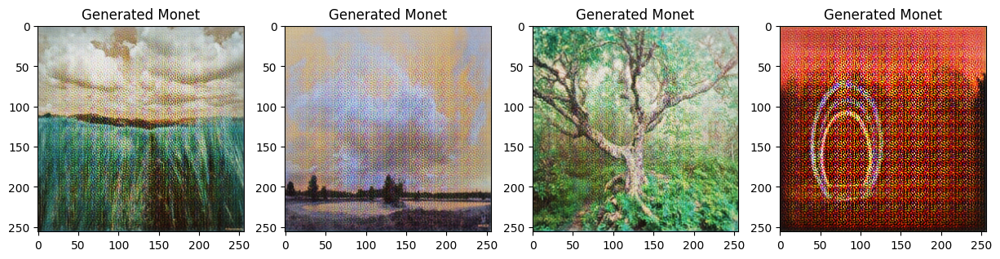

Epoch 2/10


300it [03:54,  1.28it/s]


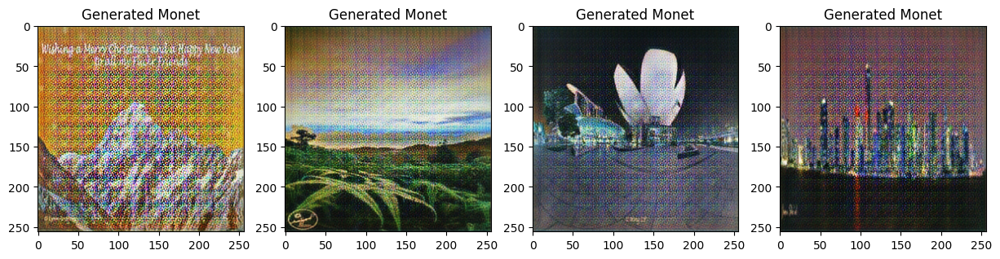

Epoch 3/10


300it [03:56,  1.27it/s]


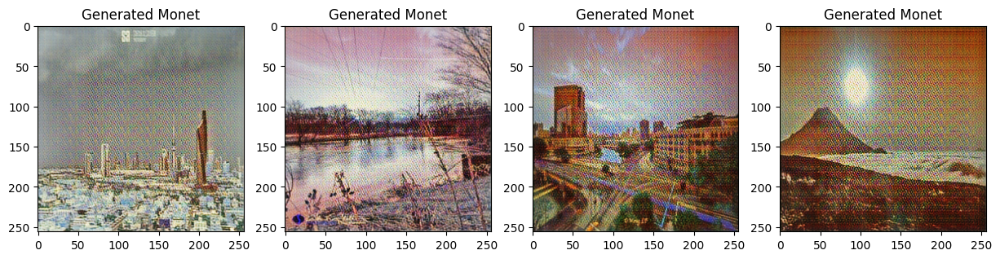

Epoch 4/10


300it [04:00,  1.25it/s]


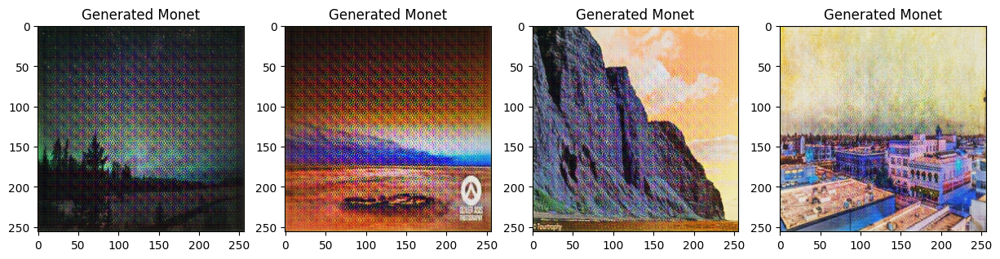

Epoch 5/10


300it [03:57,  1.26it/s]


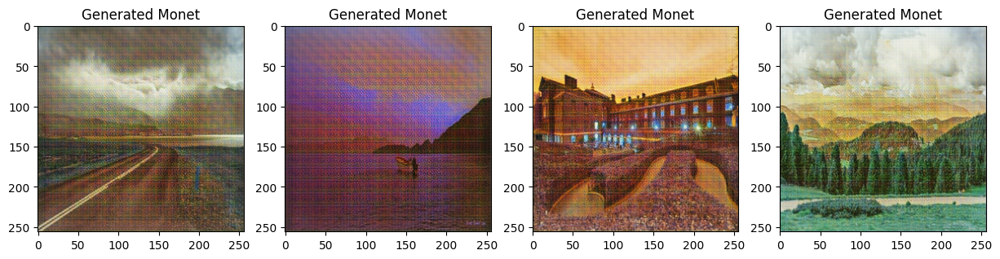

Epoch 6/10


300it [03:59,  1.25it/s]


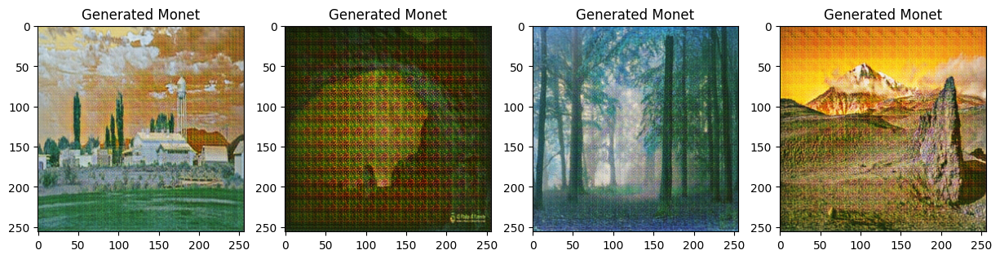

Epoch 7/10


300it [03:55,  1.27it/s]


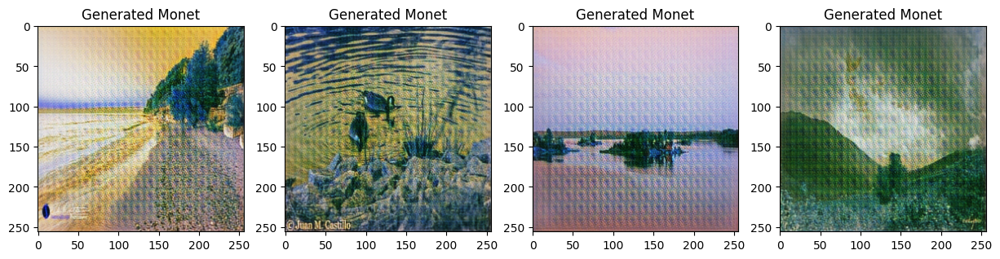

Epoch 8/10


300it [03:55,  1.27it/s]


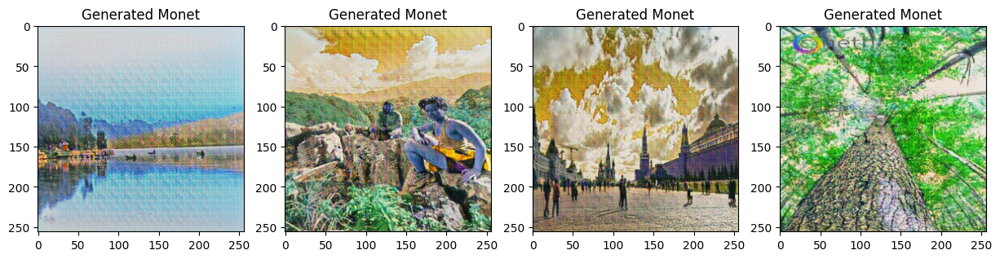

Epoch 9/10


300it [03:57,  1.27it/s]


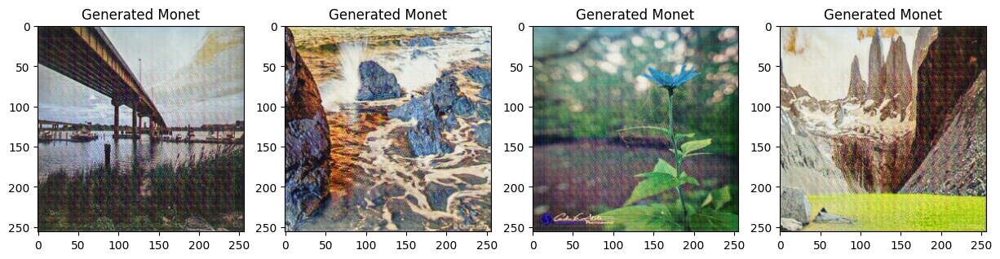

Epoch 10/10


300it [03:59,  1.25it/s]


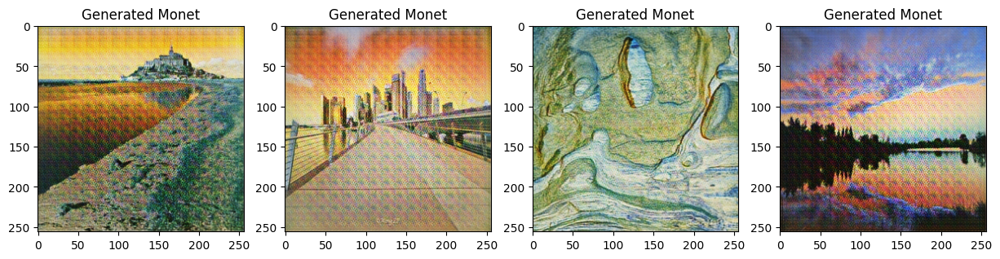

In [10]:
# Define loss functions
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real, generated):
    """
    Calculate the loss for the discriminator.
    
    Args:
        real: Predictions on real images.
        generated: Predictions on generated images.
    
    Returns:
        Total loss for the discriminator.
    """
    real_loss = loss_obj(tf.ones_like(real), real)  # Loss for real images
    generated_loss = loss_obj(tf.zeros_like(generated), generated)  # Loss for generated images
    return real_loss + generated_loss

def generator_loss(generated):
    """
    Calculate the loss for the generator.
    
    Args:
        generated: Predictions on generated images.
    
    Returns:
        Loss for the generator.
    """
    return loss_obj(tf.ones_like(generated), generated)  # Generator aims to fool the discriminator

def calc_cycle_loss(real_image, cycled_image, LAMBDA):
    """
    Calculate the cycle consistency loss.
    
    Args:
        real_image: Original image.
        cycled_image: Reconstructed image after a cycle.
        LAMBDA: Weight for the cycle loss.
    
    Returns:
        Weighted cycle consistency loss.
    """
    loss = tf.reduce_mean(tf.abs(real_image - cycled_image))  # L1 loss
    return LAMBDA * loss

def identity_loss(real_image, same_image, LAMBDA):
    """
    Calculate the identity loss.
    
    Args:
        real_image: Input image.
        same_image: Image generated without transformation.
        LAMBDA: Weight for the identity loss.
    
    Returns:
        Weighted identity loss.
    """
    loss = tf.reduce_mean(tf.abs(real_image - same_image))  # L1 loss
    return LAMBDA * 0.5 * loss  # Reduce weight by 0.5

# Define the optimizers for the generators and discriminators
monet_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
photo_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
monet_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
photo_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

# Setup checkpointing
checkpoint_prefix = os.path.join(CHECKPOINT_DIR, "ckpt")
checkpoint = tf.train.Checkpoint(
    monet_generator_optimizer=monet_generator_optimizer,
    photo_generator_optimizer=photo_generator_optimizer,
    monet_discriminator_optimizer=monet_discriminator_optimizer,
    photo_discriminator_optimizer=photo_discriminator_optimizer,
    monet_generator=monet_generator,
    photo_generator=photo_generator,
    monet_discriminator=monet_discriminator,
    photo_discriminator=photo_discriminator
)

def load_checkpoint_if_exists():
    """Load the latest checkpoint if it exists, otherwise start fresh."""
    latest_checkpoint = tf.train.latest_checkpoint(CHECKPOINT_DIR)
    if latest_checkpoint:
        print(f"Loading checkpoint from {latest_checkpoint}")
        checkpoint.restore(latest_checkpoint)
    else:
        print("No checkpoint found, starting from scratch.")

load_checkpoint_if_exists()

# Training step function
@tf.function
def train_step(photo, monet):
    """
    Perform a single training step for the CycleGAN.
    
    Args:
        photo: Batch of photos.
        monet: Batch of Monet-style images.
    
    Returns:
        Losses for the generators and discriminators.
    """
    with tf.GradientTape(persistent=True) as tape:
        # Forward pass for generators
        fake_monet = monet_generator(photo, training=True)
        cycled_photo = photo_generator(fake_monet, training=True)
        fake_photo = photo_generator(monet, training=True)
        cycled_monet = monet_generator(fake_photo, training=True)
        
        # Identity mapping for regularization
        same_photo = photo_generator(photo, training=True)
        same_monet = monet_generator(monet, training=True)
        
        # Discriminator outputs
        disc_real_photo = photo_discriminator(photo, training=True)
        disc_real_monet = monet_discriminator(monet, training=True)
        disc_fake_photo = photo_discriminator(fake_photo, training=True)
        disc_fake_monet = monet_discriminator(fake_monet, training=True)
        
        # Calculate generator losses
        gen_monet_loss = generator_loss(disc_fake_monet)
        gen_photo_loss = generator_loss(disc_fake_photo)
        total_cycle_loss = calc_cycle_loss(photo, cycled_photo, 10) + calc_cycle_loss(monet, cycled_monet, 10)
        total_gen_monet_loss = gen_monet_loss + total_cycle_loss + identity_loss(photo, same_photo, 5)
        total_gen_photo_loss = gen_photo_loss + total_cycle_loss + identity_loss(monet, same_monet, 5)
        
        # Calculate discriminator losses
        disc_monet_loss = discriminator_loss(disc_real_monet, disc_fake_monet)
        disc_photo_loss = discriminator_loss(disc_real_photo, disc_fake_photo)
    
    # Compute gradients and apply updates
    monet_generator_gradients = tape.gradient(total_gen_monet_loss, monet_generator.trainable_variables)
    photo_generator_gradients = tape.gradient(total_gen_photo_loss, photo_generator.trainable_variables)
    monet_discriminator_gradients = tape.gradient(disc_monet_loss, monet_discriminator.trainable_variables)
    photo_discriminator_gradients = tape.gradient(disc_photo_loss, photo_discriminator.trainable_variables)
    
    monet_generator_optimizer.apply_gradients(zip(monet_generator_gradients, monet_generator.trainable_variables))
    photo_generator_optimizer.apply_gradients(zip(photo_generator_gradients, photo_generator.trainable_variables))
    monet_discriminator_optimizer.apply_gradients(zip(monet_discriminator_gradients, monet_discriminator.trainable_variables))
    photo_discriminator_optimizer.apply_gradients(zip(photo_discriminator_gradients, photo_discriminator.trainable_variables))
    
    return total_gen_monet_loss, total_gen_photo_loss, disc_monet_loss, disc_photo_loss

# Display progress by showing generated images
def show_progress():
    """Display generated Monet-style images to track progress during training."""
    photo_iter = iter(photo_ds)
    plt.figure(figsize=(15, 5))
    for i in range(4):
        fake_monets = monet_generator(next(photo_iter), training=False)[0]
        plt.subplot(1, 4, i + 1)
        plt.imshow(tf.cast(fake_monets * 127.5 + 127.5, tf.uint8))  # Rescale to [0, 255] for display
        plt.title("Generated Monet")
    plt.show()

# Training function
def fit(monets, photos, epochs):
    """
    Train the CycleGAN models.
    
    Args:
        monets: Dataset of Monet-style images.
        photos: Dataset of photos.
        epochs: Number of epochs for training.
    """
    for epoch in range(epochs):
        print(f"Epoch {epoch + 1}/{epochs}")
        for mon, pho in tqdm(zip(monets, photos)):
            train_step(pho, mon)
        
        show_progress()
        checkpoint.save(file_prefix=checkpoint_prefix)

# Start training
fit(monet_ds, photo_ds, EPOCHS)


In [11]:

# Predict and save generated images
def predict_and_save(input_ds, generator_model, output_dir='images'):
    """
    Generate and save images from the generator model.
    
    Args:
        input_ds (tf.data.Dataset): Input dataset for the generator.
        generator_model (tf.keras.Model): Pretrained generator model.
        output_dir (str): Directory where generated images will be saved.
    """
    # Create the output directory if it doesn't exist
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Iterate through the dataset and generate images
    for i, img in enumerate(tqdm(input_ds, desc="Saving generated images")):
        # Generate an image using the generator model
        prediction = generator_model(img, training=False)
        
        # Rescale pixel values to [0, 255] and convert to uint8
        prediction = tf.cast(prediction * 127.5 + 127.5, tf.uint8)
        
        # Convert the tensor to a NumPy array and save as an image file
        im = Image.fromarray(tf.squeeze(prediction, axis=0).numpy())
        im.save(f"{output_dir}/{i + 1}.jpg")

    print(f"Generated images saved in '{output_dir}'.")

# Generate and save Monet-style images from the photo dataset
predict_and_save(photo_ds, monet_generator)

# Create a submission zip file
def create_submission_zip(output_dir='images', zip_name='images.zip'):
    """
    Create a zip archive of the generated images for submission.
    
    Args:
        output_dir (str): Directory containing the generated images.
        zip_name (str): Name of the zip file to create.
    """
    shutil.make_archive(zip_name.replace('.zip', ''), 'zip', output_dir)
    print(f"Submission zip file created: {zip_name}")

# Create the zip archive
create_submission_zip(output_dir='images', zip_name='images.zip')


Saving generated images: 7038it [08:09, 14.38it/s]


Generated images saved in 'images'.
Submission zip file created: images.zip


## Conclusion
This project demonstrates the successful application and training of the CycleGAN model in an unpaired way across the domains of image-to-image translation. The training participants trained on Monet datasets and real photographs and were able to transform photographs into Monet paintings and the other way around. Through the combination of adversary, cycle-consistency, and identity losses, the CycleGAN model enhanced results in the task of domain adaptation.


### Future Work: 
Improvements can be achieved with training of the model on larger, more heterogeneous datasets, testing more sophisticated data augmentation methods, and improving hyperparameters of the model. Furthermore, Tandem application of CycleGAN along other directions such as medical imaging or video-to-video transformations would also showcase its capabilities. This project aims to demonstrate the power of CycleGAN in performing unpaired image translation with a focus on applications in art, science, and industry.